### adapted from https://github.com/dpcook/fun_analysis/blob/master/tabula_muris/mouse_atlas_scanpy.ipynb
### and https://nbviewer.jupyter.org/github/theislab/scanpy_usage/blob/master/170505_seurat/seurat.ipynb


In [1]:
import numpy as np
import pandas as pd
import csv
import scanpy.api as sc
from igraph import *
from MulticoreTSNE import MulticoreTSNE as TSNE #faster TSNE alternative
from anndata import read_h5ad
sc.logging.print_versions()
results_file = './write/maca.processed.h5ad'


/home/ubuntu/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


scanpy==1.2.2 anndata==0.6.4 numpy==1.14.3 scipy==1.1.0 pandas==0.23.0 scikit-learn==0.19.1 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


# Load data

In [12]:
adata = read_h5ad('./write/maca.h5ad')

# Preprocessing

In [13]:
sc.pp.filter_genes(adata, min_cells=5)
sc.pp.filter_cells(adata, min_genes=250)

In [14]:
adata

AnnData object with n_obs × n_vars = 426360 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes'
    var: 'n_cells'

In [15]:
# add the total counts per cell as observations-annotation to adata
adata.obs['n_counts'] = np.sum(adata.X, axis=1).A1

In [6]:
adata

AnnData object with n_obs × n_vars = 426360 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes', 'n_counts'
    var: 'n_cells'

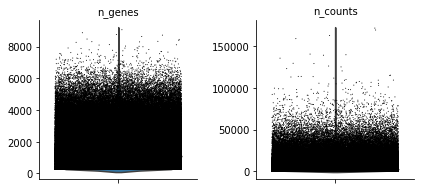

In [7]:
axs = sc.pl.violin(adata, ['n_genes', 'n_counts'],
                   jitter=0.4, multi_panel=True)

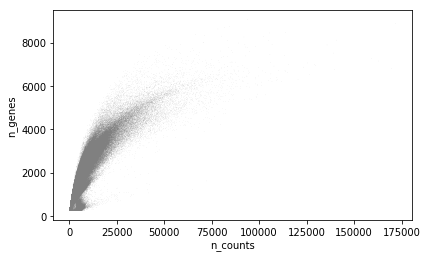

In [8]:
ax = sc.pl.scatter(adata, x='n_counts', y='n_genes')

In [9]:
adata.raw = sc.pp.log1p(adata, copy=True) # freezes the state of the AnnData object returned by sc.pp.log1p
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4) #simple lib size normalization?

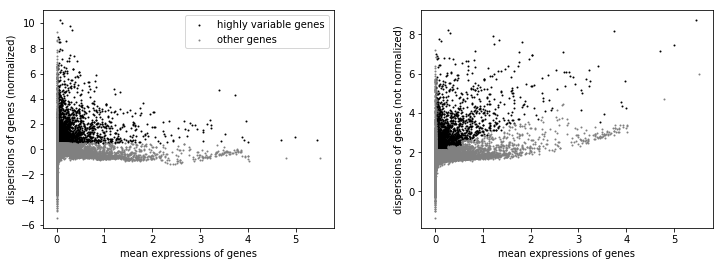

In [10]:
filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.0125, max_mean=10, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result)

In [11]:
adata = adata[:, filter_result.gene_subset]

In [12]:
sc.pp.log1p(adata)

In [13]:
sc.pp.scale(adata, max_value=10)

In [14]:
adata.write(results_file)

# Exploration


## Choose a tissue

In [14]:
#import gc
#gc.collect()


11285

In [34]:
tissofinterest = "Muscle"
tiss = adata[adata.obs['Tissue'] == tissofinterest,:]
tiss2 = tiss.obs[tiss.obs['Age'] == '3m']
tiss3 = tiss.obs[tiss.obs['Age'] == '24m']
#tiss2 = tiss[[tiss.obs['Age'] == ['3m'] | tiss.obs['Age'] == ['24m']],:]

#tiss3 = tiss[tiss.obs['Age'] == ['24m'],:]
#tiss = pd.concat(tiss2,tiss3)


In [35]:
tiss

View of AnnData object with n_obs × n_vars = 46333 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes', 'n_counts'
    var: 'n_cells'

In [36]:
tissaux = tiss2.append(tiss3)
tiss = adata[adata.obs.index.isin(tissaux.index),:]

In [37]:
tiss

View of AnnData object with n_obs × n_vars = 16696 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes', 'n_counts'
    var: 'n_cells'

## PCA

In [38]:
sc.tl.pca(tiss)

In [39]:
tiss

AnnData object with n_obs × n_vars = 16696 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes', 'n_counts'
    var: 'n_cells'
    uns: 'pca'
    obsm: 'X_pca'
    varm: 'PCs'

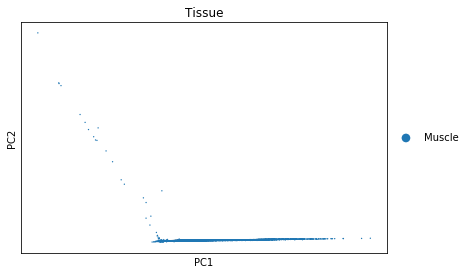

In [40]:
ax = sc.pl.pca_scatter(tiss, color=['Tissue'], right_margin=0.5)

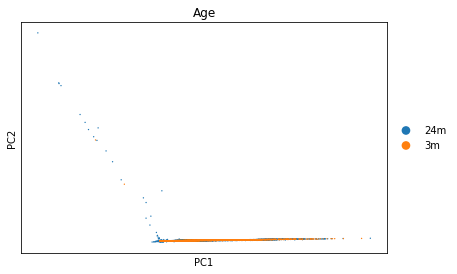

In [41]:
ax = sc.pl.pca_scatter(tiss, color=['Age'], right_margin=0.5)

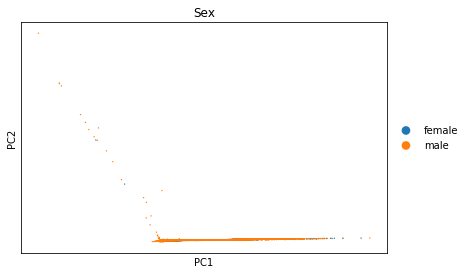

In [42]:
ax = sc.pl.pca_scatter(tiss, color=['Sex'], right_margin=0.5)

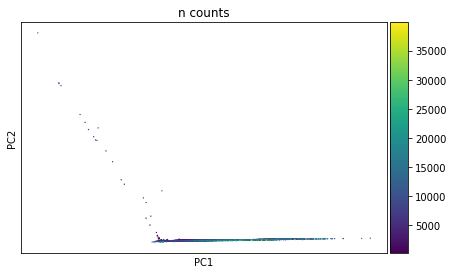

In [43]:
ax = sc.pl.pca_scatter(tiss, color='n_counts', right_margin=0.5)

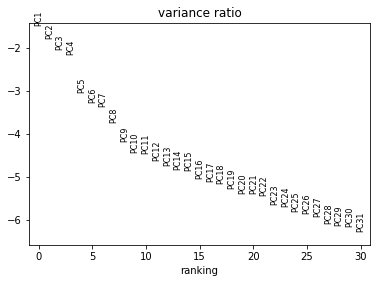

In [44]:
sc.pl.pca_variance_ratio(tiss, log=True)

## Louvain clustering

In [45]:
sc.pp.neighbors(tiss, n_neighbors=15)#, method='gauss')
sc.tl.louvain(tiss, resolution = 0.3)

In [46]:
tiss

AnnData object with n_obs × n_vars = 16696 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'pca', 'Tissue_colors', 'Age_colors', 'Sex_colors', 'neighbors', 'louvain'
    obsm: 'X_pca'
    varm: 'PCs'

## UMAP

In [ ]:
sc.tl.umap(tiss)

In [ ]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss, color=['Tissue'], right_margin=0.5)

In [ ]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss, color=['louvain'], right_margin=0.5)

In [ ]:
sc.settings.set_figure_params(dpi=200)
sc.pl.umap(tiss, color=['Age'], right_margin=0.5)

## tSNE

In [47]:
sc.tl.tsne(tiss, perplexity=50)

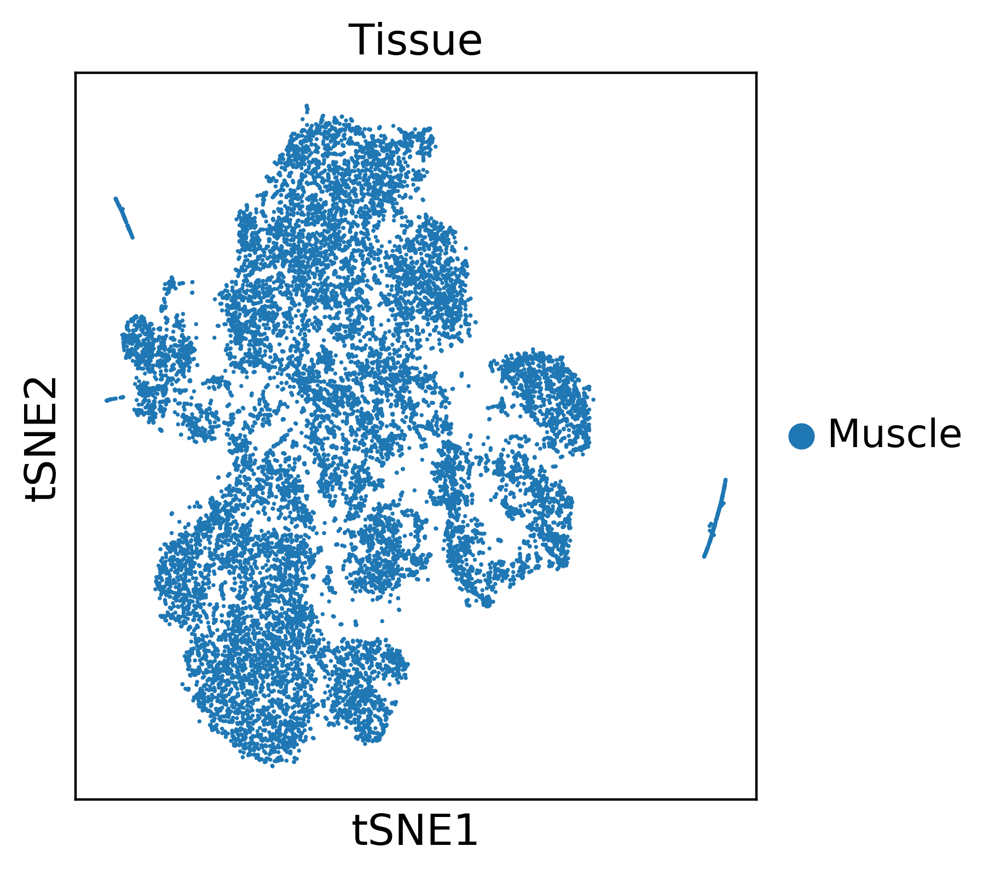

In [48]:
sc.settings.set_figure_params(dpi=200)
sc.pl.tsne(tiss, color=['Tissue'], right_margin=0.5)

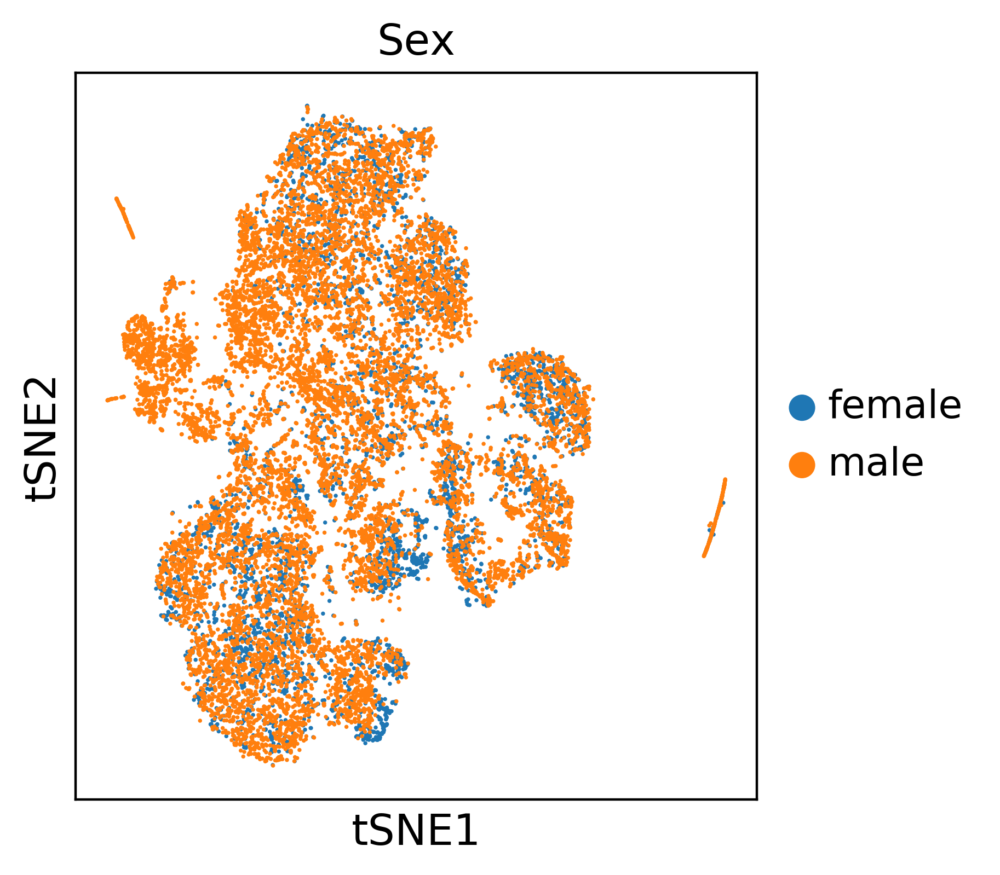

In [49]:
sc.pl.tsne(tiss, color=['Sex'], right_margin=0.5)

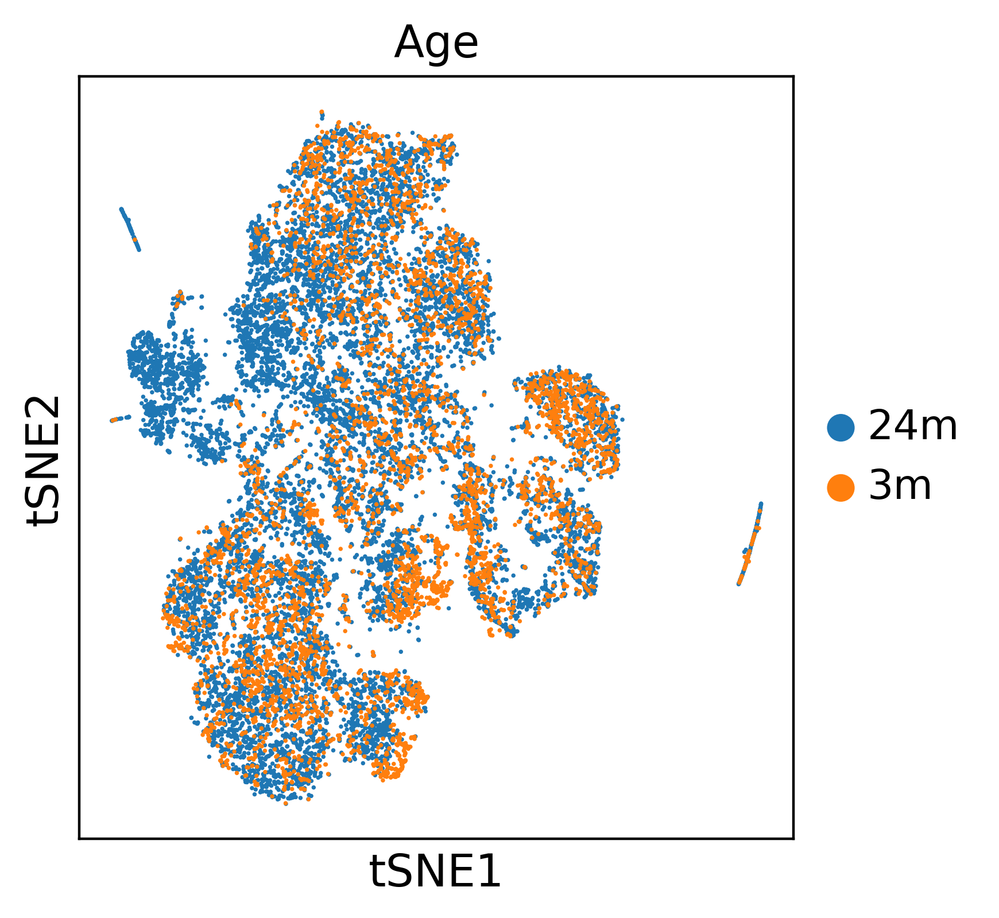

In [50]:
sc.pl.tsne(tiss, color=['Age'], right_margin=0.5)

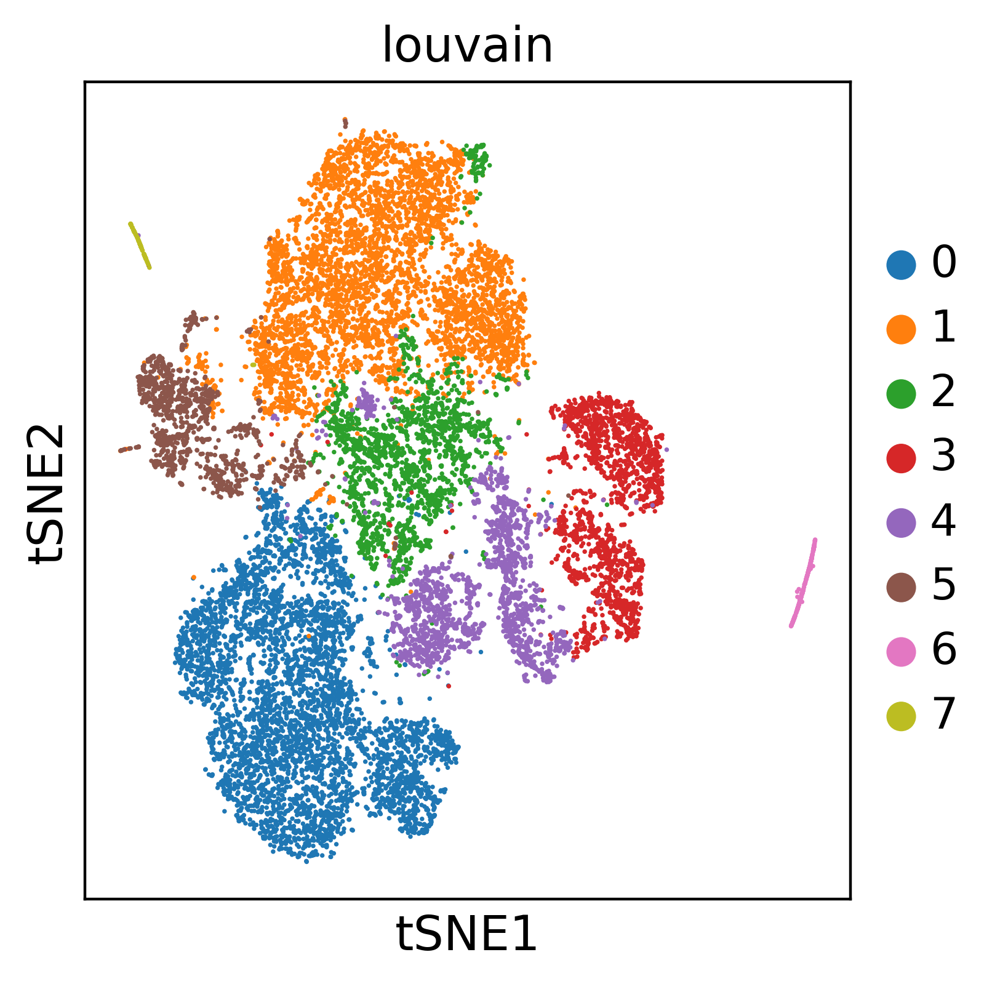

In [51]:
sc.pl.tsne(tiss, color=['louvain'],right_margin=0.5)

## read the annotations from tabula muris

In [52]:
maca10x3metadata2 = pd.read_csv('/data/maca/data/10x/TM_droplet_metadata.csv', low_memory=False)
maca10x3metadata2 = maca10x3metadata2.rename(columns = {'cell':'Cell'})
len(maca10x3metadata2)

70118

In [53]:
ageofinterest = "3m"
tissage = tiss[tiss.obs['Age'] == ageofinterest,:]
tissage

View of AnnData object with n_obs × n_vars = 4542 × 19875 
    obs: 'Age', 'Cell', 'Channel', 'Sex', 'Tissue', 'batch', 'n_genes', 'n_counts', 'louvain'
    var: 'n_cells'
    uns: 'pca', 'Tissue_colors', 'Age_colors', 'Sex_colors', 'neighbors', 'louvain', 'louvain_colors'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'

In [54]:
tissage.obs.head()

,Age,Cell,Channel,Sex,Tissue,batch,n_genes,n_counts,louvain
index,,,,,,,,,
AAACCTGCAGGTCCAC-1-89-3,3m,10X_P7_14_AAACCTGCAGGTCCAC,10X_P7_14,female,Muscle,3,1934,6372.0,2
AAACCTGCATCAGTAC-1-89-3,3m,10X_P7_14_AAACCTGCATCAGTAC,10X_P7_14,female,Muscle,3,925,1825.0,1
AAACCTGGTGCCTGGT-1-89-3,3m,10X_P7_14_AAACCTGGTGCCTGGT,10X_P7_14,female,Muscle,3,1436,3907.0,2
AAACCTGGTTATCACG-1-89-3,3m,10X_P7_14_AAACCTGGTTATCACG,10X_P7_14,female,Muscle,3,948,2527.0,4
AAACCTGTCCCAGGTG-1-89-3,3m,10X_P7_14_AAACCTGTCCCAGGTG,10X_P7_14,female,Muscle,3,861,2458.0,3


In [55]:
maca10x3metadata2.head()

,Cell,channel,mouse.id,tissue,subtissue,mouse.sex,method,cell_ontology_class,cell_ontology_id,free_annotation
0,10X_P4_0_AAACCTGAGATTACCC,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,basal cell of epidermis,CL:0002187,proliferating
1,10X_P4_0_AAACCTGAGTGCCAGA,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,keratinocyte,CL:0000312,differentiated
2,10X_P4_0_AAACCTGCAAATCCGT,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,keratinocyte,CL:0000312,suprabasal differentiating
3,10X_P4_0_AAACCTGGTAATCGTC,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,basal cell of epidermis,CL:0002187,basal cells
4,10X_P4_0_AAACCTGGTCCAACTA,10X_P4_0,3-M-8,Tongue,NaN,M,droplet,basal cell of epidermis,CL:0002187,proliferating


In [56]:
merged_inner = pd.merge(left=tissage.obs,right=maca10x3metadata2, left_on='Cell', right_on='Cell')
#merged_inner = merged_inner[['Age','Cell','Channel','Sex','Tissue','batch','n_genes','n_counts','cell_ontology_class','free_annotation']]
merged_inner.head()

,Age,Cell,Channel,Sex,Tissue,batch,n_genes,n_counts,louvain,channel,mouse.id,tissue,subtissue,mouse.sex,method,cell_ontology_class,cell_ontology_id,free_annotation
0,3m,10X_P7_14_AAACCTGCAGGTCCAC,10X_P7_14,female,Muscle,3,1934,6372.0,2,10X_P7_14,3-F-56,Limb_Muscle,NaN,F,droplet,endothelial cell,CL:0000115,NaN
1,3m,10X_P7_14_AAACCTGCATCAGTAC,10X_P7_14,female,Muscle,3,925,1825.0,1,10X_P7_14,3-F-56,Limb_Muscle,NaN,F,droplet,endothelial cell,CL:0000115,NaN
2,3m,10X_P7_14_AAACCTGGTGCCTGGT,10X_P7_14,female,Muscle,3,1436,3907.0,2,10X_P7_14,3-F-56,Limb_Muscle,NaN,F,droplet,NaN,NaN,unknown
3,3m,10X_P7_14_AAACCTGGTTATCACG,10X_P7_14,female,Muscle,3,948,2527.0,4,10X_P7_14,3-F-56,Limb_Muscle,NaN,F,droplet,T cell,CL:0000084,NaN
4,3m,10X_P7_14_AAACCTGTCCCAGGTG,10X_P7_14,female,Muscle,3,861,2458.0,3,10X_P7_14,3-F-56,Limb_Muscle,NaN,F,droplet,B cell,CL:0000236,NaN


In [57]:
tissage.obs["cell_ontology_class"] = merged_inner["cell_ontology_class"]
tissage.obs["free_annotation"] = merged_inner["free_annotation"]
tissage.obs

,Age,Cell,Channel,Sex,Tissue,batch,n_genes,n_counts,louvain,cell_ontology_class,free_annotation
index,,,,,,,,,,,
AAACCTGCAGGTCCAC-1-89-3,3m,10X_P7_14_AAACCTGCAGGTCCAC,10X_P7_14,female,Muscle,3,1934,6372.0,2,NaN,NaN
AAACCTGCATCAGTAC-1-89-3,3m,10X_P7_14_AAACCTGCATCAGTAC,10X_P7_14,female,Muscle,3,925,1825.0,1,NaN,NaN
AAACCTGGTGCCTGGT-1-89-3,3m,10X_P7_14_AAACCTGGTGCCTGGT,10X_P7_14,female,Muscle,3,1436,3907.0,2,NaN,NaN
AAACCTGGTTATCACG-1-89-3,3m,10X_P7_14_AAACCTGGTTATCACG,10X_P7_14,female,Muscle,3,948,2527.0,4,NaN,NaN
AAACCTGTCCCAGGTG-1-89-3,3m,10X_P7_14_AAACCTGTCCCAGGTG,10X_P7_14,female,Muscle,3,861,2458.0,3,NaN,NaN
AAACGGGAGAGTGACC-1-89-3,3m,10X_P7_14_AAACGGGAGAGTGACC,10X_P7_14,female,Muscle,3,917,2198.0,0,NaN,NaN
AAACGGGAGTACGCGA-1-89-3,3m,10X_P7_14_AAACGGGAGTACGCGA,10X_P7_14,female,Muscle,3,1826,6782.0,0,NaN,NaN
AAACGGGAGTTTCCTT-1-89-3,3m,10X_P7_14_AAACGGGAGTTTCCTT,10X_P7_14,female,Muscle,3,3305,19328.0,3,NaN,NaN
AAACGGGCAAGTCTAC-1-89-3,3m,10X_P7_14_AAACGGGCAAGTCTAC,10X_P7_14,female,Muscle,3,2087,5639.0,0,NaN,NaN


In [58]:
tissage.obs = tissage.obs.reset_index()

In [59]:
tissage.obs["cell_ontology_class"] = merged_inner["cell_ontology_class"]
tissage.obs["free_annotation"] = merged_inner["free_annotation"]
tissage.obs

,index,Age,Cell,Channel,Sex,Tissue,batch,n_genes,n_counts,louvain,cell_ontology_class,free_annotation
0,AAACCTGCAGGTCCAC-1-89-3,3m,10X_P7_14_AAACCTGCAGGTCCAC,10X_P7_14,female,Muscle,3,1934,6372.0,2,endothelial cell,NaN
1,AAACCTGCATCAGTAC-1-89-3,3m,10X_P7_14_AAACCTGCATCAGTAC,10X_P7_14,female,Muscle,3,925,1825.0,1,endothelial cell,NaN
2,AAACCTGGTGCCTGGT-1-89-3,3m,10X_P7_14_AAACCTGGTGCCTGGT,10X_P7_14,female,Muscle,3,1436,3907.0,2,NaN,unknown
3,AAACCTGGTTATCACG-1-89-3,3m,10X_P7_14_AAACCTGGTTATCACG,10X_P7_14,female,Muscle,3,948,2527.0,4,T cell,NaN
4,AAACCTGTCCCAGGTG-1-89-3,3m,10X_P7_14_AAACCTGTCCCAGGTG,10X_P7_14,female,Muscle,3,861,2458.0,3,B cell,NaN
5,AAACGGGAGAGTGACC-1-89-3,3m,10X_P7_14_AAACGGGAGAGTGACC,10X_P7_14,female,Muscle,3,917,2198.0,0,mesenchymal stem cell,NaN
6,AAACGGGAGTACGCGA-1-89-3,3m,10X_P7_14_AAACGGGAGTACGCGA,10X_P7_14,female,Muscle,3,1826,6782.0,0,mesenchymal stem cell,NaN
7,AAACGGGAGTTTCCTT-1-89-3,3m,10X_P7_14_AAACGGGAGTTTCCTT,10X_P7_14,female,Muscle,3,3305,19328.0,3,macrophage,NaN
8,AAACGGGCAAGTCTAC-1-89-3,3m,10X_P7_14_AAACGGGCAAGTCTAC,10X_P7_14,female,Muscle,3,2087,5639.0,0,mesenchymal stem cell,NaN
9,AAACGGGGTCTAACGT-1-89-3,3m,10X_P7_14_AAACGGGGTCTAACGT,10X_P7_14,female,Muscle,3,1940,5083.0,2,endothelial cell,NaN


In [60]:
tissage.obs.head()

,index,Age,Cell,Channel,Sex,Tissue,batch,n_genes,n_counts,louvain,cell_ontology_class,free_annotation
0,AAACCTGCAGGTCCAC-1-89-3,3m,10X_P7_14_AAACCTGCAGGTCCAC,10X_P7_14,female,Muscle,3,1934,6372.0,2,endothelial cell,NaN
1,AAACCTGCATCAGTAC-1-89-3,3m,10X_P7_14_AAACCTGCATCAGTAC,10X_P7_14,female,Muscle,3,925,1825.0,1,endothelial cell,NaN
2,AAACCTGGTGCCTGGT-1-89-3,3m,10X_P7_14_AAACCTGGTGCCTGGT,10X_P7_14,female,Muscle,3,1436,3907.0,2,NaN,unknown
3,AAACCTGGTTATCACG-1-89-3,3m,10X_P7_14_AAACCTGGTTATCACG,10X_P7_14,female,Muscle,3,948,2527.0,4,T cell,NaN
4,AAACCTGTCCCAGGTG-1-89-3,3m,10X_P7_14_AAACCTGTCCCAGGTG,10X_P7_14,female,Muscle,3,861,2458.0,3,B cell,NaN


In [61]:
#sc.tl.pca(tissage)
#sc.pp.neighbors(tissage, n_neighbors=15)#, method='gauss')
#sc.tl.louvain(tissage, resolution = 0.3)
#sc.tl.tsne(tissage, perplexity=50)

... storing 'cell_ontology_class' as categorical
... storing 'free_annotation' as categorical


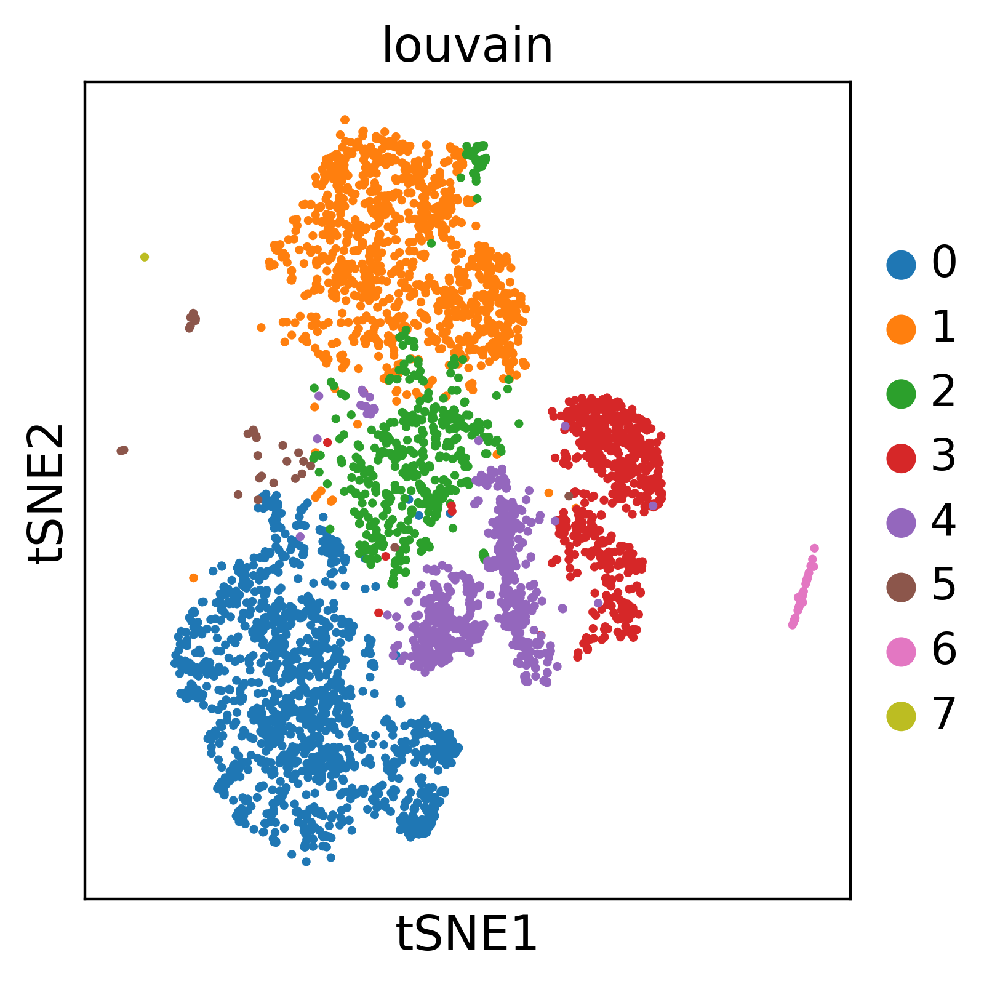

In [62]:
sc.pl.tsne(tissage, color=['louvain'],right_margin=0.5)

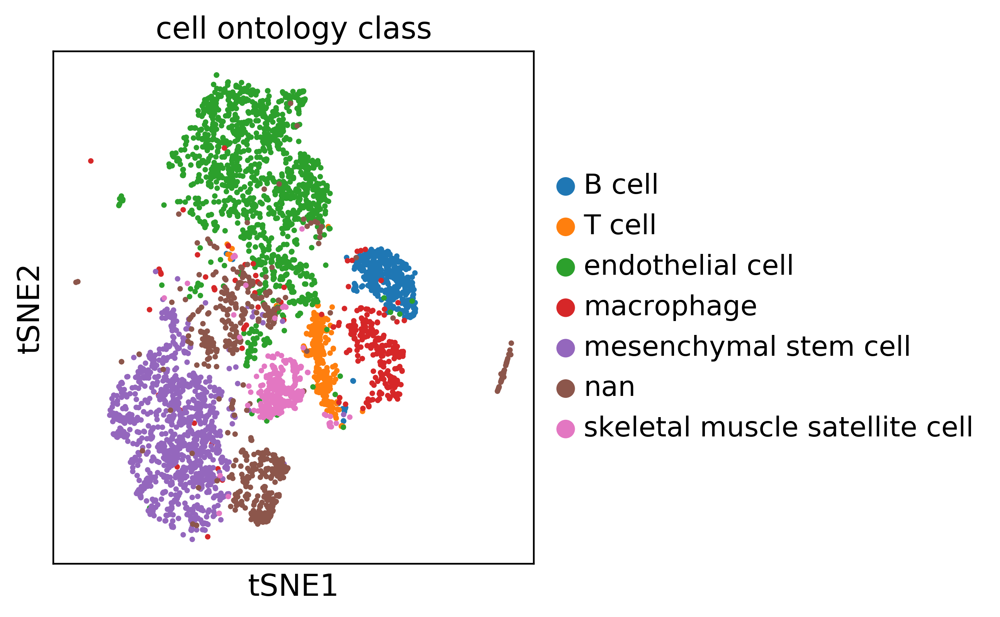

In [63]:
sc.pl.tsne(tissage, color=['cell_ontology_class'],right_margin=0.5)

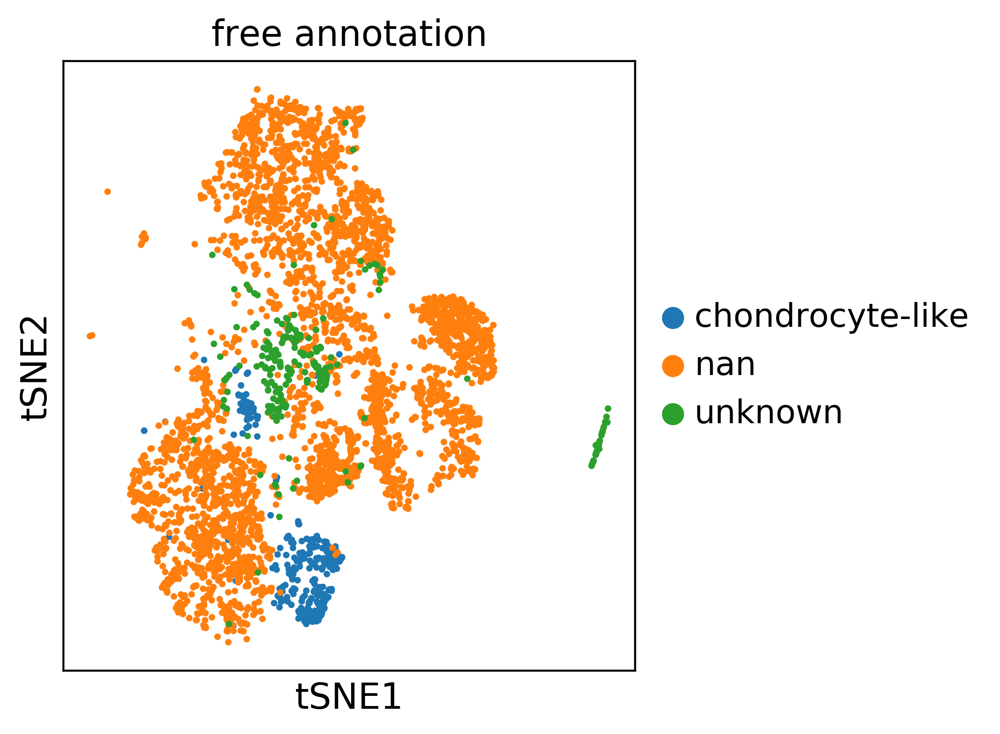

In [64]:
sc.pl.tsne(tissage, color=['free_annotation'],right_margin=0.5)

In [73]:
df = tissage.obs[tissage.obs['louvain'].str.match('2')]['cell_ontology_class']
df.reset_index()
df = df.reset_index()
display(df.groupby('cell_ontology_class').count())
display(df.groupby('cell_ontology_class').count().sum())
display(df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum())
dfaux = df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
dfaux.reset_index()
dfaux = dfaux.reset_index()
display(dfaux[dfaux['index']>0.95][['cell_ontology_class']])
#dfdf.sum()
#df.drop_duplicates()
#tissage.obs['louvain']
val = dfaux[dfaux['index']>0.95][['cell_ontology_class']].values[0]
print(val)

,index
cell_ontology_class,
B cell,0
T cell,4
endothelial cell,247
macrophage,17
mesenchymal stem cell,9
nan,169
skeletal muscle satellite cell,8


index    454
dtype: int64

,index
cell_ontology_class,
B cell,0.000000
T cell,0.008811
endothelial cell,0.544053
macrophage,0.037445
mesenchymal stem cell,0.019824
nan,0.372247
skeletal muscle satellite cell,0.017621


,cell_ontology_class


IndexError: index 0 is out of bounds for axis 0 with size 0

In [82]:
tiss_cell_ontology_class = {}
for i in range(0,tissage.obs['louvain'].nunique()):
    df = tissage.obs[tissage.obs['louvain'].str.match(str(i))]['cell_ontology_class']
    df.reset_index()
    df = df.reset_index()
    #df.groupby('cell_ontology_class').count()
    #df.groupby('cell_ontology_class').count().sum()
    #df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
    dfaux = df.groupby('cell_ontology_class').count()/df.groupby('cell_ontology_class').count().sum()
    dfaux.reset_index()
    dfaux = dfaux.reset_index()
    #display(dfaux[dfaux['index']>0.95][['cell_ontology_class']])
    #dfdfaux = pd.concat([dfdfaux,dfaux[dfaux['index']>0.95][['cell_ontology_class']]])
    a = dfaux[dfaux['index']>0.95][['cell_ontology_class']]
    if a.empty:
        tiss_cell_ontology_class[i] = 'tbc'
    else:
        tiss_cell_ontology_class[i] = a.values[0]

tiss_cell_ontology_class



{0: 'tbc',
 1: array(['endothelial cell'], dtype=object),
 2: 'tbc',
 3: 'tbc',
 4: 'tbc',
 5: 'tbc',
 6: array(['nan'], dtype=object),
 7: array(['macrophage'], dtype=object)}

In [83]:
tiss.obs['louvain'] = tiss.obs['louvain'].apply(pd.to_numeric)
tiss.obs['cell_ontology_class'] = tiss.obs['louvain'].map(tiss_cell_ontology_class)
tiss.obs

,Age,Cell,Channel,Sex,Tissue,batch,n_genes,n_counts,louvain,cell_ontology_class
index,,,,,,,,,,
AAACCTGAGAGATGAG-1-13-2,24m,NA,NaN,male,Muscle,2,843,2427.0,4,tbc
AAACCTGAGTACGCGA-1-13-2,24m,NA,NaN,male,Muscle,2,497,946.0,1,[endothelial cell]
AAACCTGCAACTTGAC-1-13-2,24m,NA,NaN,male,Muscle,2,1906,7250.0,0,tbc
AAACCTGCACGAAACG-1-13-2,24m,NA,NaN,male,Muscle,2,1266,3463.0,4,tbc
AAACCTGGTGTGCGTC-1-13-2,24m,NA,NaN,male,Muscle,2,2323,8653.0,0,tbc
AAACCTGTCACGCGGT-1-13-2,24m,NA,NaN,male,Muscle,2,845,1508.0,1,[endothelial cell]
AAACCTGTCCACGTTC-1-13-2,24m,NA,NaN,male,Muscle,2,2765,12803.0,0,tbc
AAACGGGAGAAACGAG-1-13-2,24m,NA,NaN,male,Muscle,2,1172,2495.0,1,[endothelial cell]
AAACGGGAGTTCCACA-1-13-2,24m,NA,NaN,male,Muscle,2,592,1012.0,1,[endothelial cell]


... storing 'cell_ontology_class' as categorical


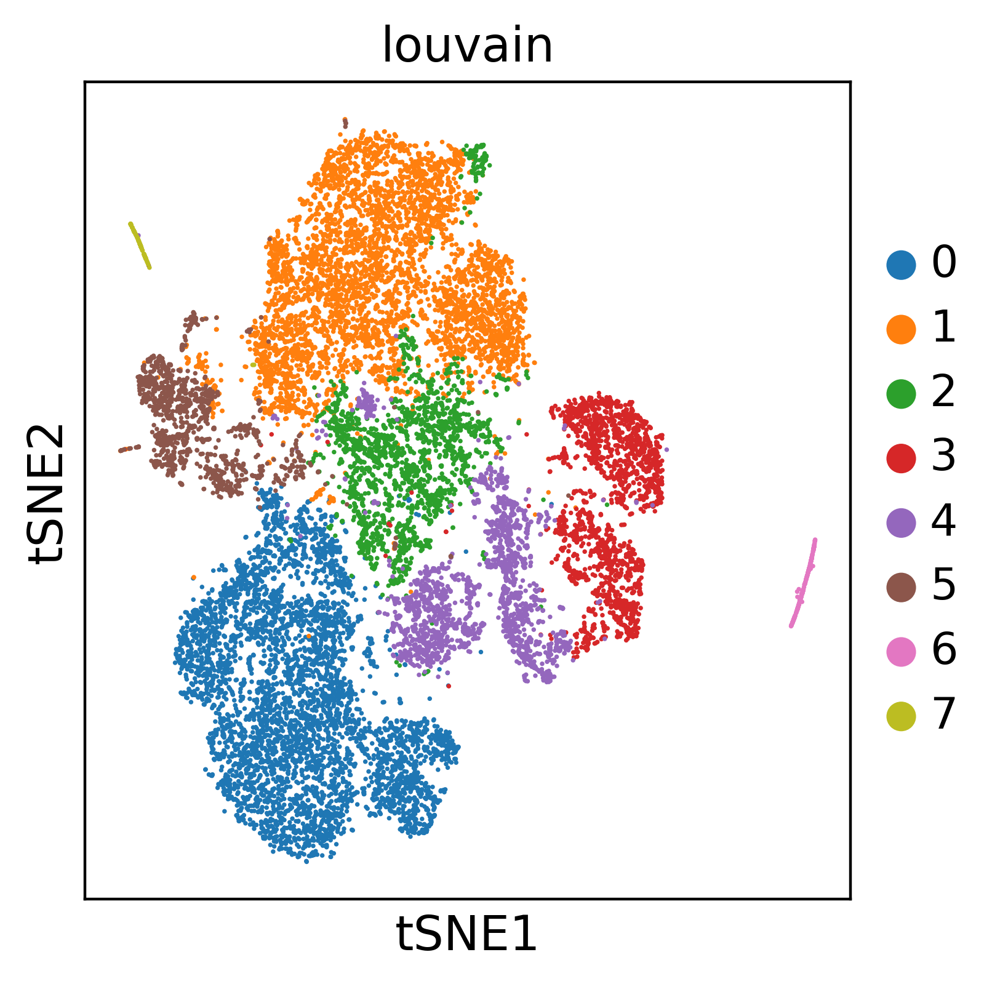

In [84]:
sc.pl.tsne(tiss, color=['louvain'],right_margin=0.5)

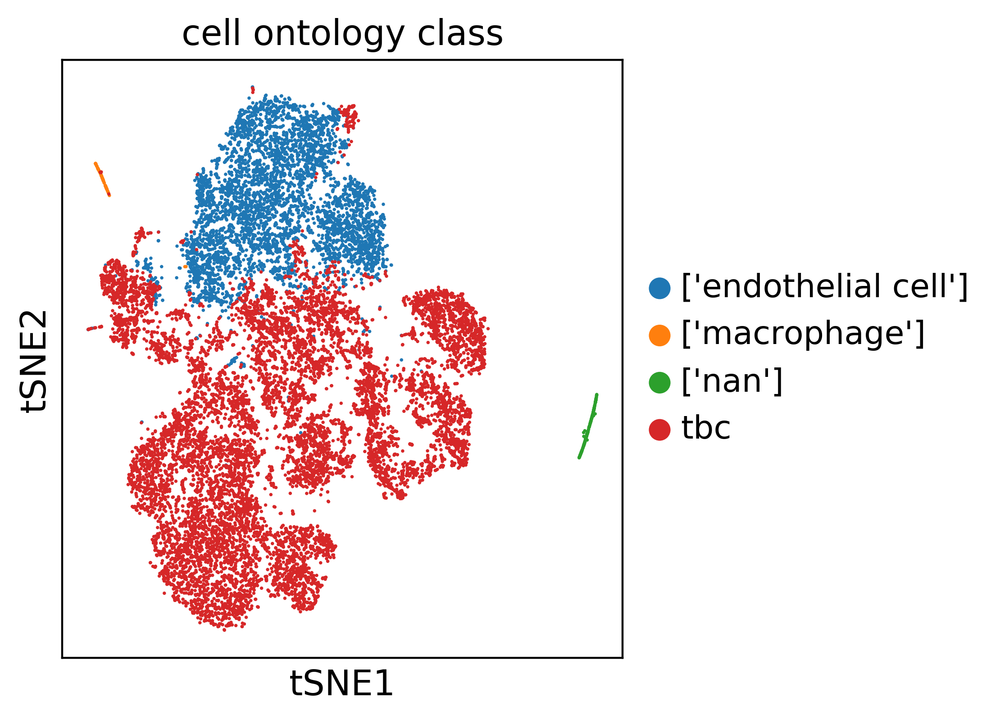

In [85]:
sc.pl.tsne(tiss, color=['cell_ontology_class'],right_margin=0.5)

## finding marker genes

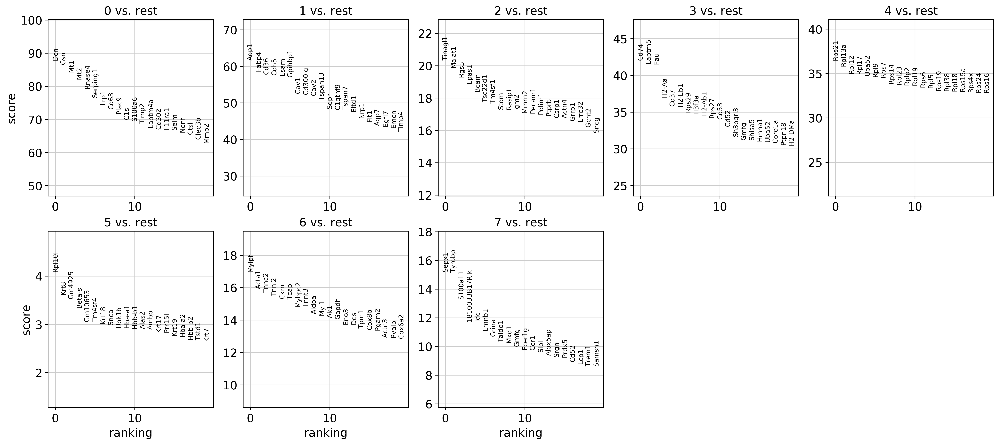

In [86]:
sc.tl.rank_genes_groups(tiss, 'louvain')
sc.pl.rank_genes_groups(tiss, n_genes=20)#, save='.pdf')
#adata.write(results_file)

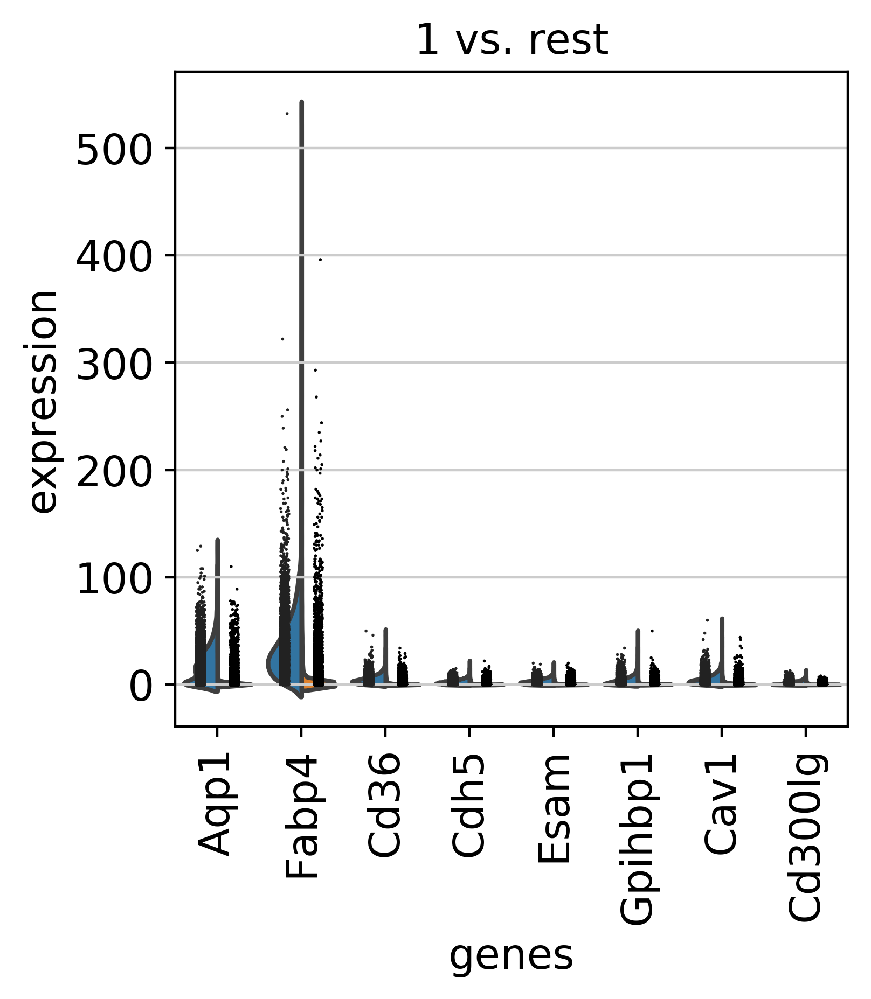

In [87]:
sc.pl.rank_genes_groups_violin(tiss, n_genes=8, groups=['1'])

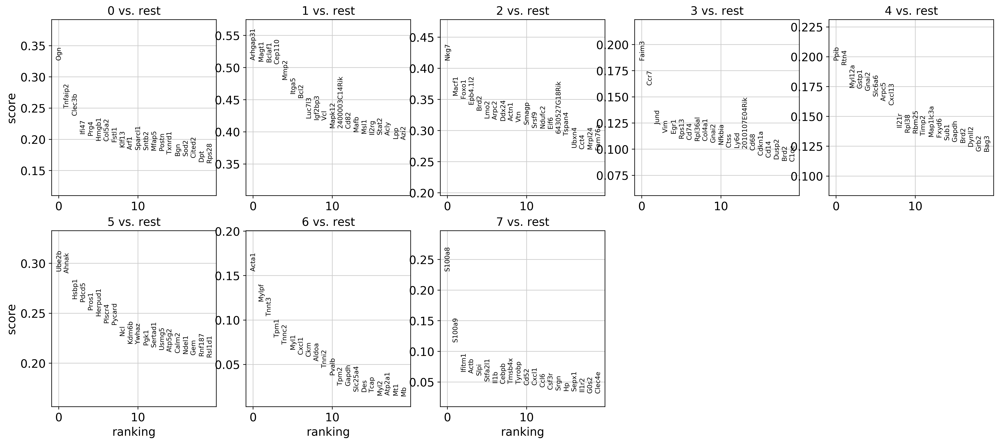

In [88]:
sc.tl.rank_genes_groups(tiss, 'louvain', method='logreg')
sc.pl.rank_genes_groups(tiss, n_genes=20)

### Show the 10 top ranked genes per cluster in a dataframe.

In [89]:
pd.DataFrame(tiss.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7
0,Ogn,Arhgap31,Nkg7,Faim3,Ppib,Ube2b,Acta1,S100a8
1,Tnfaip2,Magt1,Macf1,Ccr7,Rtn4,Ahnak,Mylpf,S100a9
2,Clec3b,Bclaf1,Foxo1,Jund,Myl12a,Hsbp1,Tnnt3,Ifitm1
3,Ifi47,Cep110,Epb4.1l2,Vim,Gstp1,Pdcd5,Tpm1,Actb
4,Prg4,Mmp2,Brd2,Egr1,Gnai2,Pros1,Tnnc2,Slpi
5,Hmgb1,Itga5,Lmo2,Rps13,Slc6a6,Herpud1,Myl1,Stfa2l1
6,Col5a2,Bcl2,Arpc2,Cd74,Arpc5,Plscr4,Cxcl1,Il1b
7,Fstl1,Luc7l3,Ddx24,Rpl36al,Cxcl13,Pycard,Ckm,Cebpb
8,Klf13,Igf2bp3,Actn1,Col4a1,Il21r,Ncl,Aldoa,Tmsb4x
9,Arf1,Vcl,Vtn,Gnai2,Rpl38,Kdm6b,Tnni2,Tyrobp


### Get a table with scores and groups.



In [90]:
result = tiss.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame({group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores']}).head(5)

,0_n,0_s,1_n,1_s,2_n,2_s,3_n,3_s,4_n,4_s,5_n,5_s,6_n,6_s,7_n,7_s
0,Ogn,0.326730,Arhgap31,0.511519,Nkg7,0.413072,Faim3,0.185048,Ppib,0.197139,Ube2b,0.291989,Acta1,0.154815,S100a8,0.230691
1,Tnfaip2,0.249691,Magt1,0.509477,Macf1,0.356366,Ccr7,0.161110,Rtn4,0.193297,Ahnak,0.290099,Mylpf,0.121038,S100a9,0.114778
2,Clec3b,0.237977,Bclaf1,0.508345,Foxo1,0.351695,Jund,0.123421,Myl12a,0.174035,Hsbp1,0.264275,Tnnt3,0.104351,Ifitm1,0.066785
3,Ifi47,0.208703,Cep110,0.505362,Epb4.1l2,0.341912,Vim,0.115608,Gstp1,0.173454,Pdcd5,0.261414,Tpm1,0.080303,Actb,0.063978
4,Prg4,0.206012,Mmp2,0.481230,Brd2,0.332414,Egr1,0.114936,Gnai2,0.171558,Pros1,0.253243,Tnnc2,0.072509,Slpi,0.060555


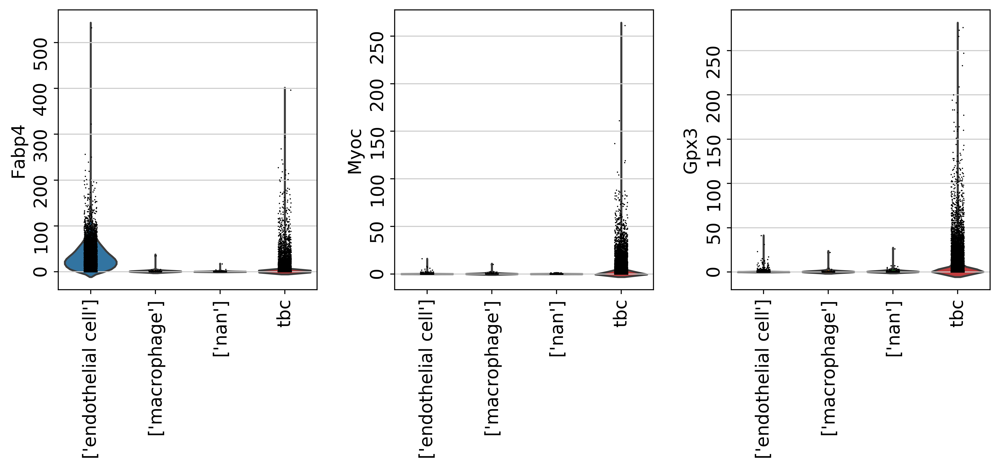

In [91]:
sc.pl.violin(tiss, ['Fabp4','Myoc','Gpx3'],groupby='cell_ontology_class', rotation=90)#, save='.pdf')


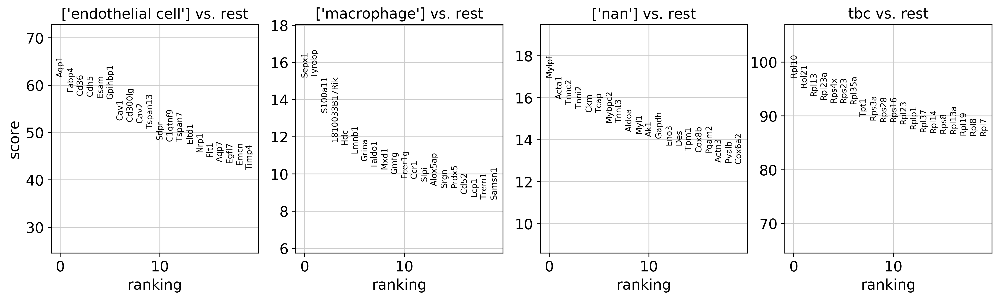

In [92]:
sc.tl.rank_genes_groups(tiss, 'cell_ontology_class')
sc.pl.rank_genes_groups(tiss, n_genes=20)

## Force-directed graph

In [ ]:
sc.tl.draw_graph(adata) # be patient here...

In [ ]:
sc.pl.draw_graph(adata, color=['Tissue'])

In [ ]:
sc.pl.draw_graph(adata, color=['Age'])

In [ ]:
sc.pl.draw_graph(adata, color=['Sex'])

In [ ]:
sc.pl.draw_graph(adata, color=['louvain'])

# Pseudotime analysis

In [ ]:
#sc.tl.dpt(adata, n_branchings=1)

In [ ]:
#sc.pl.diffmap(adata, color=['dpt_pseudotime', 'dpt_groups', 'age'])

In [ ]:
#sc.pl.diffmap(adata, color=['dpt_pseudotime'])

In [ ]:
#sc.pl.diffmap(adata, color=['dpt_groups'])

In [ ]:
#sc.pl.diffmap(adata, color=['Age'])

# Save processed data

In [ ]:
adata.write('./write/maca.processed.h5ad')